In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error

### load in the data.
remember we will not be using the test set until we are happy with our model generated from the train + validate sets

In [ ]:
train = pd.read_excel('TRAIN language data.xlsx')
validate = pd.read_excel('VAL language data.xlsx')

In [ ]:
for x in train.columns:
    print(x)

Unnamed: 0
lastfm_url
track
artist
seeds
number_of_emotion_tags
valence_tags
arousal_tags
dominance_tags
mbid
spotify_id
genre
track edited
artist edited
Lyrics
HF_byline_average_sentiment
HF_byline_minimum_sentiment
HF_byline_maximum_sentiment
HF_byline_median_sentiment
HF_byline_stdv_sentiment
HF_byline_firstquartile_sentiment
HF_byline_thirdquartile_sentiment
HF_byline_ratio_negative
HF_byline_ratio_positive
HF_fullinput512_one_sentiment_number
HF_fullinput512_one_sentiment_label
number_lines
HF_ROBERTA_byline_average_sentiment
HF_ROBERTA_byline_minimum_sentiment
HF_ROBERTA_byline_maximum_sentiment
HF_ROBERTA_byline_median_sentiment
HF_ROBERTA_byline_stdv_sentiment
HF_ROBERTA_byline_firstquartile_sentiment
HF_ROBERTA_byline_thirdquartile_sentiment
HF_ROBERTA_byline_ratio_negative
HF_ROBERTA_byline_ratio_positive
HF_ROBERTA_fullinput512_one_sentiment_number
HF_ROBERTA_fullinput512_one_sentiment_label
SPLIT
VADER_byline_average_sentiment
VADER_byline_minimum_sentiment
VADER_byline_max

In [ ]:
all_float_or_int_features = []

for column in train.columns:
    if (train[column].dtype == 'float64' or train[column].dtype == 'int64') and column not in ['number_of_emotion_tags', 'valence_tags', 'arousal_tags', 'dominance_tags']:
        all_float_or_int_features.append(column)
    else:
        print(column)

In [ ]:
# combine the train and validate data
train_validate = pd.concat([train, validate], ignore_index=True, sort=False)
del all_float_or_int_features[0]

X_train_validate = train_validate[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
ytrain_validate_dominance = train_validate['dominance_tags']
ytrain_validate_arousal = train_validate['arousal_tags']
ytrain_validate_valence = train_validate['valence_tags']

3 fold CV:

[ X = 1/3 of data, Y = 1/3 of data, Z = 1/3 of data]

first iteration of 3 fold CV: train with X, Y and test with Z

second iteration: train with X, Z and test with Y

third iteration: train with Y, Z and teest with X

### first we need to do feature selection

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression, r_regression
from sklearn.linear_model import LinearRegression

X_train = train[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
y_train = train['dominance_tags']
X_test = validate[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
y_test = validate['dominance_tags']

mae_per_k = []
for k_ in range(1,len(X_train.columns)+1):

    # configure to select all features
    skb = SelectKBest(score_func = r_regression, k=k_)

    # learn relationship from training data
    fit = skb.fit(X_train, y_train)

    cols = skb.get_support(indices=True)

    X_train_selected = X_train.iloc[:,cols]
    X_test_selected = X_test.iloc[:,cols]

    # fit the model
    model = LinearRegression()
    model.fit(X_train_selected, y_train)

    # evaluate the model
    y_pred = model.predict(X_test_selected)

    # evaluate predictions
    mae = mean_absolute_error(y_test, y_pred)
    mae_per_k.append(mae)


In [ ]:
for x,y in zip(mae_per_k, range(1,len(X_train.columns)+1)):
    print(x,y)

0.7680389190952727 1
0.7604799131509896 2
0.7559466277186103 3
0.7543509678990364 4
0.7545561207216203 5
0.7557001331580264 6
0.7551855193333976 7
0.7551248936284543 8
0.7553868114144892 9
0.7552657381815086 10
0.7555671113242476 11
0.7551109254190985 12
0.7553195308245116 13
0.7553795862633235 14
0.7552968757888653 15
0.7552594679448079 16
0.7546958311112878 17
0.7552521107404242 18
0.7544482877413109 19
0.7545868399189133 20
0.7546111984939122 21
0.7537273790830467 22
0.7534443534209296 23
0.7534207876300072 24
0.752952078147745 25
0.7534110082199362 26
0.7534733940576153 27
0.7539056238393793 28
0.7542386116321106 29
0.7541873144492596 30
0.7547183134545101 31
0.755246946235725 32
0.7550627188370586 33
0.7554183313736988 34
0.7557260899435531 35
0.7544163586450539 36
0.7537782102234263 37
0.7529598134719074 38
0.7525375044409919 39
0.7525214489231534 40
0.7512351384972932 41
0.7511807716392878 42
0.7514739906483974 43
0.7515226358580848 44
0.7512604411589376 45
0.7515575982178191 46

In [ ]:
min(zip(mae_per_k, range(1,len(X_train.columns)+1)))

(0.7503169736222141, 94)

In [ ]:
skb = SelectKBest(score_func=r_regression, k=94)

# learn relationship from training data
fit = skb.fit(X_train, y_train)

cols = skb.get_support(indices=True)

X_train_validate_feature_selection = X_train_validate.iloc[:,cols]

In [ ]:
X_train_validate_feature_selection

,HF_byline_minimum_sentiment,HF_byline_maximum_sentiment,HF_byline_median_sentiment,HF_byline_firstquartile_sentiment,HF_byline_thirdquartile_sentiment,HF_byline_ratio_positive,HF_fullinput512_one_sentiment_number,number_lines,HF_ROBERTA_byline_average_sentiment,HF_ROBERTA_byline_maximum_sentiment,...,NER_CARDINAL_count,NER_TOTAL_count,NER_GPE_freq,NER_WORK_OF_ART_freq,NER_LAW_freq,NER_TIME_freq,NER_MONEY_freq,NER_QUANTITY_freq,NER_ORDINAL_freq,NER_CARDINAL_freq
0,-0.999760,0.997664,-0.965877,-0.994159,-0.905857,0.055556,-0.998336,72,-0.078673,0.998394,...,0,14,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
1,-0.999579,0.999694,0.941719,-0.965138,0.990951,0.722222,-0.931936,72,0.556966,0.998659,...,0,11,0.015021,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
2,-0.998660,0.998525,-0.774362,-0.993212,0.988254,0.487805,-0.995360,41,-0.076941,0.998025,...,0,7,0.000000,0.0,0.0,0.000000,0.0,0.0,0.007722,0.000000
3,-0.999783,0.999845,-0.990921,-0.998319,0.983211,0.370968,-0.975729,62,-0.517764,0.998425,...,0,2,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
4,-0.998956,0.999341,0.010943,-0.983533,0.995863,0.500000,0.971135,28,-0.505310,0.998660,...,0,2,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8710,-0.998437,0.999887,0.961458,-0.831240,0.999780,0.583333,0.996110,24,0.342728,0.998726,...,0,3,0.000000,0.0,0.0,0.005682,0.0,0.0,0.000000,0.000000
8711,-0.999770,0.999834,0.967137,-0.969914,0.999015,0.684932,-0.879429,73,-0.099986,0.998476,...,1,2,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.003509
8712,-0.999499,0.999877,-0.990442,-0.999010,0.867781,0.291667,-0.991053,24,-0.499029,0.998692,...,0,1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000
8713,-0.999662,0.999863,-0.863972,-0.994159,0.995051,0.423729,-0.994832,59,-0.048775,0.998871,...,23,35,0.000000,0.0,0.0,0.000000,0.0,0.0,0.003937,0.045276


In [ ]:
skb = SelectKBest(score_func=r_regression, k=5)

# learn relationship from training data
fit = skb.fit(X_train, y_train)

cols = skb.get_support(indices=True)

X_train_validate.iloc[:,cols]

,HF_byline_ratio_positive,HF_ROBERTA_byline_average_sentiment,HF_ROBERTA_byline_ratio_positive,VADER_byline_average_sentiment,base_verb_count
0,0.055556,-0.078673,0.458333,-0.237789,35
1,0.722222,0.556966,0.777778,0.022781,3
2,0.487805,-0.076941,0.463415,0.087412,41
3,0.370968,-0.517764,0.241935,-0.228690,25
4,0.500000,-0.505310,0.250000,0.129836,21
...,...,...,...,...,...
8710,0.583333,0.342728,0.666667,0.194492,18
8711,0.684932,-0.099986,0.452055,-0.048468,6
8712,0.291667,-0.499029,0.250000,-0.089288,13
8713,0.423729,-0.048775,0.474576,0.068608,29


### define your grid search for a regression problem
https://machinelearningmastery.com/hyperparameter-optimization-with-random-search-and-grid-search/
- Grid search allows us to learn the best HYPERparameters (not parameters which are the coefficients learned in the training step from the training data) for a given ML model. Hyperparameters affect the way the chosen algorithm LEARNS.

I always tend to use an EstimatorSelectionHelper (from https://www.davidsbatista.net/blog/2018/02/23/model_optimization/) to do my Grid Search. There are other packages that can help as well.

We can combine the train and validate sets into one for the grid search purpose as it does its own cross validation (https://en.wikipedia.org/wiki/Cross-validation_(statistics))

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import GridSearchCV

'''
Classes are like outlines for creating "objects"
Here our object is an EstimatorSelectionHelper.
We will define its attributes (models, params, keys, grid_searches)
as well as its methods (fit(), score_summary())
'''

class EstimatorSelectionHelper:

    # classes always have an __init__ function
    # this initializes (creates) the object with specific parameters (variables)
    # so when we create a new "EstimatorSelectionHelper" object
    # we know we need to pass it two parameters (inputs): models and params

    def __init__(self, models, params):
        if not set(models.keys()).issubset(set(params.keys())):
            missing_params = list(set(models.keys()) - set(params.keys()))
            raise ValueError("Some estimators are missing parameters: %s" % missing_params)
        self.models = models
        self.params = params
        self.keys = models.keys()
        self.grid_searches = {}

    # this fit function takes in our training data (we can combine train and validate
    # since this class does its own cross validation) and it fits the list of
    # models you give it with EACH variation of parameter combinations
    # it will return the model + parameter combination and the associated score

    def fit(self, X, y, cv=3, n_jobs=3, verbose=1, scoring=None, refit=False):
        for key in self.keys:
            print("Running GridSearchCV for %s." % key)
            model = self.models[key]
            params = self.params[key]
            gs = GridSearchCV(model, params, cv=cv, n_jobs=n_jobs,
                              verbose=verbose, scoring=scoring, refit=refit,
                              return_train_score=True)
            gs.fit(X,y)
            self.grid_searches[key] = gs

    # score summary allows you to print out a table of the models/parameters/scores
    # by default it sorts by the mean score of the K cross validation folds

    def score_summary(self, sort_by='mean_score'):
        def row(key, scores, params):
            d = {
                 'estimator': key,
                 'min_score': min(scores),
                 'max_score': max(scores),
                 'mean_score': np.mean(scores),
                 'std_score': np.std(scores),
            }
            return pd.Series({**params,**d})

        rows = []
        for k in self.grid_searches:
            print(k)
            params = self.grid_searches[k].cv_results_['params']
            scores = []
            for i in range(self.grid_searches[k].cv):
                key = "split{}_test_score".format(i)
                r = self.grid_searches[k].cv_results_[key]
                scores.append(r.reshape(len(params),1))

            all_scores = np.hstack(scores)
            for p, s in zip(params,all_scores):
                rows.append((row(k, s, p)))

        df = pd.concat(rows, axis=1).T.sort_values([sort_by], ascending=False)

        columns = ['estimator', 'min_score', 'mean_score', 'max_score', 'std_score']
        columns = columns + [c for c in df.columns if c not in columns]

        return df[columns]

In [ ]:
# now let's define the models and parameters we want to explore in our grid search
# generally, we can just try out all Regression models that sklearn has implemented
# it might take a long time to run but it is good to try all options

# see all regression options on this page: https://scikit-learn.org/stable/supervised_learning.html

# Linear Models
# Kernal Ridge Regression
# Support Vector Machines
# Stochastic Gradient Descent
# Nearest Neighbors
# Gaussian Processes
# Naive Bayes
# Decision Trees
# Neural Networks

from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

# the more "classic" regression equations
# the three differ by the type of objective function used
models_ridge = {'Ridge': Ridge()}
models_lasso = {'Lasso': Lasso()}
# support vector machine
models_SVR = {'SVR': SVR()}
# these two are ensembles of more classic regression equations
models_gradient_boost = {'GradientBoostingRegressor': GradientBoostingRegressor()}
models_ada_boost = {'AdaBoostRegressor': AdaBoostRegressor()}
# random forests are ensembles of decision trees: https://www.saedsayad.com/decision_tree_reg.htm#:~:text=Decision%20tree%20builds%20regression%20or,decision%20nodes%20and%20leaf%20nodes.
models_random_forest = {'RandomForestRegressor': RandomForestRegressor()}
# multi-layer perceptron
models_mlp = {'MLPRegressor': MLPRegressor()}

params_ridge = {'Ridge': { 'alpha': 10.0**-np.arange(1,7), 'fit_intercept': [True, False], 'solver': ['svd', 'cholesky', 'lsqr', 'sag']}}
params_lasso = {'Lasso': { 'alpha': 10.0**-np.arange(1,7) }}
params_SVR = {'SVR': {'kernel': ['linear'], 'C': [0.05, 0.01], 'degree':[1], 'epsilon':[0.2, 0.5, 1]} }
params_gradient_boost = {'GradientBoostingRegressor': { 'learning_rate': np.logspace(-1.5, 0.5, 10), 'n_estimators': np.linspace(25, 75, endpoint=False, num=15).astype(int), 'min_samples_leaf': [6, 8, 10]}}
params_gradient_boost2 = {'GradientBoostingRegressor': { 'learning_rate': [0.1], 'n_estimators': [100, 200], 'min_samples_leaf': [8,10], 'loss': ['absolute_error'], 'criterion': ['squared_error']}}
params_ada_boost = {'AdaBoostRegressor': { 'learning_rate': np.logspace(-1.5, 0.5, 10), 'n_estimators': np.linspace(25, 75, endpoint=False, num=15).astype(int) }}
params_random_forest = {'RandomForestRegressor': { 'n_estimators': np.linspace(25, 75, endpoint=False, num=15).astype(int), 'min_samples_leaf': [6, 8, 10] }}
params_mlp = {'MLPRegressor': {}}



#### this is all using the 94 features found with SelectKBest and r_regression

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html
helper_ridge = EstimatorSelectionHelper(models_ridge, params_ridge)
helper_ridge.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ridge.score_summary(sort_by='mean_score')

Running GridSearchCV for Ridge.
Fitting 10 folds for each of 48 candidates, totalling 480 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

Ridge


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


,estimator,min_score,mean_score,max_score,std_score,alpha,fit_intercept,solver
1,Ridge,-0.939913,-0.777408,-0.51895,0.116875,0.1,True,cholesky
0,Ridge,-0.939913,-0.777408,-0.51895,0.116875,0.1,True,svd
4,Ridge,-0.93991,-0.777651,-0.518956,0.116916,0.1,False,svd
5,Ridge,-0.93991,-0.777651,-0.518956,0.116916,0.1,False,cholesky
9,Ridge,-0.939706,-0.777867,-0.520646,0.116477,0.01,True,cholesky
8,Ridge,-0.939706,-0.777867,-0.520646,0.116477,0.01,True,svd
40,Ridge,-0.939624,-0.777937,-0.520572,0.116569,0.000001,True,svd
41,Ridge,-0.939624,-0.77794,-0.520572,0.116572,0.000001,True,cholesky
33,Ridge,-0.939705,-0.77795,-0.52055,0.116578,0.00001,True,cholesky
32,Ridge,-0.939705,-0.77795,-0.52055,0.116579,0.00001,True,svd


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html
helper_lasso = EstimatorSelectionHelper(models_lasso, params_lasso)
helper_lasso.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_lasso.score_summary(sort_by='mean_score')

Running GridSearchCV for Lasso.
Fitting 10 folds for each of 6 candidates, totalling 60 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.311e+02, tolerance: 8.311e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.912e+02, tolerance: 7.767e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.846e+03, tolerance: 8.365e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.679e+03, tolerance: 8.096e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Lasso


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.858e+03, tolerance: 8.365e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.897e+03, tolerance: 8.458e-01
  model = cd_fast.enet_coordinate_descent(


,estimator,min_score,mean_score,max_score,std_score,alpha
3,Lasso,-0.939933,-0.77696,-0.516943,0.117279,0.0001
4,Lasso,-0.939312,-0.777304,-0.51877,0.116579,0.00001
5,Lasso,-0.939993,-0.777751,-0.519094,0.116625,0.000001
2,Lasso,-0.941758,-0.778249,-0.519268,0.116946,0.001
1,Lasso,-0.952159,-0.783875,-0.527254,0.116497,0.01
0,Lasso,-0.967509,-0.801041,-0.566045,0.113646,0.1


In [ ]:
# https://towardsdatascience.com/unlocking-the-true-power-of-support-vector-regression-847fd123a4a0#:~:text=Support%20Vector%20Regression%20is%20a,the%20maximum%20number%20of%20points.
# https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html

# SVR takes forever, scaling helps
from sklearn.preprocessing import MinMaxScaler
scaling = MinMaxScaler(feature_range=(-1,1)).fit(X_train_validate_feature_selection)
X_train_validate_feature_selection_scaled = scaling.transform(X_train_validate_feature_selection)

helper_SVR = EstimatorSelectionHelper(models_SVR, params_SVR)
helper_SVR.fit(X_train_validate_feature_selection_scaled, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_SVR.score_summary(sort_by='mean_score')

Running GridSearchCV for SVR.
Fitting 10 folds for each of 6 candidates, totalling 60 fits
SVR


,estimator,min_score,mean_score,max_score,std_score,C,degree,epsilon,kernel
0,SVR,-0.988209,-0.761562,-0.450052,0.133942,0.05,1,0.2,linear
3,SVR,-0.993224,-0.76201,-0.446223,0.135708,0.01,1,0.2,linear
1,SVR,-0.938231,-0.765597,-0.475317,0.123732,0.05,1,0.5,linear
4,SVR,-0.942716,-0.766095,-0.473165,0.12475,0.01,1,0.5,linear
2,SVR,-1.004325,-0.7877,-0.538035,0.122073,0.05,1,1,linear
5,SVR,-1.009283,-0.790604,-0.5479,0.121161,0.01,1,1,linear


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html
helper_gradient_boost = EstimatorSelectionHelper(models_gradient_boost, params_gradient_boost)
helper_gradient_boost.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_gradient_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for GradientBoostingRegressor.
Fitting 10 folds for each of 450 candidates, totalling 4500 fits
GradientBoostingRegressor


,estimator,min_score,mean_score,max_score,std_score,learning_rate,min_samples_leaf,n_estimators
102,GradientBoostingRegressor,-0.934047,-0.773217,-0.503152,0.118058,0.087992,6,65
101,GradientBoostingRegressor,-0.935142,-0.773222,-0.503833,0.118104,0.087992,6,61
103,GradientBoostingRegressor,-0.933828,-0.773268,-0.502426,0.118189,0.087992,6,68
99,GradientBoostingRegressor,-0.934842,-0.773311,-0.505254,0.117633,0.087992,6,55
100,GradientBoostingRegressor,-0.93451,-0.773326,-0.505402,0.117522,0.087992,6,58
...,...,...,...,...,...,...,...,...
418,GradientBoostingRegressor,-14917138896977364254720.0,-12866678372655014346752.0,-11126102397004525076480.0,1200755715860488781824.0,3.162278,6,68
433,GradientBoostingRegressor,-14917138896977364254720.0,-12866678372655047901184.0,-11126102397004525076480.0,1200755715860540948480.0,3.162278,8,68
434,GradientBoostingRegressor,-150806450331727410757632.0,-130055950814162970476544.0,-112480551405177437945856.0,12143750275752387411968.0,3.162278,8,71
449,GradientBoostingRegressor,-150806450331726622228480.0,-130055950814163020808192.0,-112480551405177085624320.0,12143750275752483880960.0,3.162278,10,71


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html
helper_gradient_boost = EstimatorSelectionHelper(models_gradient_boost, params_gradient_boost2)
helper_gradient_boost.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_gradient_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for GradientBoostingRegressor.
Fitting 10 folds for each of 4 candidates, totalling 40 fits
GradientBoostingRegressor


,estimator,min_score,mean_score,max_score,std_score,criterion,learning_rate,loss,min_samples_leaf,n_estimators
0,GradientBoostingRegressor,-0.985967,-0.758782,-0.448917,0.134923,squared_error,0.1,absolute_error,8,100
2,GradientBoostingRegressor,-0.987273,-0.759243,-0.449302,0.134928,squared_error,0.1,absolute_error,10,100
1,GradientBoostingRegressor,-0.981596,-0.760872,-0.453157,0.133191,squared_error,0.1,absolute_error,8,200
3,GradientBoostingRegressor,-0.985517,-0.76166,-0.454136,0.134126,squared_error,0.1,absolute_error,10,200


In [ ]:
# https://towardsdatascience.com/understanding-adaboost-2f94f22d5bfe
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html
helper_ada_boost = EstimatorSelectionHelper(models_ada_boost, params_ada_boost)
helper_ada_boost.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ada_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for AdaBoostRegressor.
Fitting 10 folds for each of 150 candidates, totalling 1500 fits
AdaBoostRegressor


,estimator,min_score,mean_score,max_score,std_score,learning_rate,n_estimators
0,AdaBoostRegressor,-0.977271,-0.785739,-0.539892,0.117468,0.031623,25
1,AdaBoostRegressor,-0.979344,-0.786069,-0.538566,0.117739,0.031623,28
2,AdaBoostRegressor,-0.983191,-0.787758,-0.547,0.116436,0.031623,31
4,AdaBoostRegressor,-0.987045,-0.788635,-0.548273,0.116578,0.031623,38
3,AdaBoostRegressor,-0.992931,-0.788959,-0.548998,0.116996,0.031623,35
...,...,...,...,...,...,...,...
139,AdaBoostRegressor,-1.533343,-0.998732,-0.735897,0.20667,3.162278,38
141,AdaBoostRegressor,-1.500432,-1.00231,-0.74308,0.195798,3.162278,45
145,AdaBoostRegressor,-1.562164,-1.00867,-0.706322,0.217412,3.162278,58
137,AdaBoostRegressor,-1.448589,-1.012006,-0.658386,0.202935,3.162278,31


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
helper_random_forest = EstimatorSelectionHelper(models_random_forest, params_random_forest)
helper_random_forest.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_random_forest.score_summary(sort_by='mean_score')

Running GridSearchCV for RandomForestRegressor.
Fitting 10 folds for each of 45 candidates, totalling 450 fits
RandomForestRegressor


,estimator,min_score,mean_score,max_score,std_score,min_samples_leaf,n_estimators
43,RandomForestRegressor,-0.949937,-0.77696,-0.505538,0.119441,10,68
40,RandomForestRegressor,-0.950021,-0.77796,-0.507318,0.118687,10,58
28,RandomForestRegressor,-0.947583,-0.778281,-0.512684,0.11768,8,68
37,RandomForestRegressor,-0.952708,-0.778571,-0.508888,0.118843,10,48
44,RandomForestRegressor,-0.942742,-0.778669,-0.506758,0.118275,10,71
38,RandomForestRegressor,-0.943595,-0.778794,-0.504217,0.118599,10,51
42,RandomForestRegressor,-0.947756,-0.778823,-0.507294,0.118369,10,65
32,RandomForestRegressor,-0.949785,-0.779189,-0.509526,0.117044,10,31
35,RandomForestRegressor,-0.950791,-0.779844,-0.513763,0.116529,10,41
29,RandomForestRegressor,-0.951298,-0.779862,-0.508793,0.118619,8,71


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html
helper_mlp = EstimatorSelectionHelper(models_mlp, params_mlp)
helper_mlp.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_mlp.score_summary(sort_by='mean_score')

Running GridSearchCV for MLPRegressor.
Fitting 10 folds for each of 1 candidates, totalling 10 fits
MLPRegressor


,estimator,min_score,mean_score,max_score,std_score
0,MLPRegressor,-1.86051,-0.962503,-0.74774,0.306972


#### we could also choose ar ound number like 10 and do feature selection and repeat the grid search

In [ ]:
skb = SelectKBest(score_func=r_regression, k=10)

# learn relationship from training data
fit = skb.fit(X_train, y_train)

cols = skb.get_support(indices=True)

X_train_validate_feature_selection = X_train_validate.iloc[:,cols]

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html
helper_ridge = EstimatorSelectionHelper(models_ridge, params_ridge)
helper_ridge.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ridge.score_summary(sort_by='mean_score')

Running GridSearchCV for Ridge.
Fitting 10 folds for each of 48 candidates, totalling 480 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

Ridge


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


,estimator,min_score,mean_score,max_score,std_score,alpha,fit_intercept,solver
1,Ridge,-0.944612,-0.77928,-0.523465,0.116628,0.1,True,cholesky
0,Ridge,-0.944612,-0.77928,-0.523465,0.116628,0.1,True,svd
9,Ridge,-0.944618,-0.779305,-0.523484,0.116639,0.01,True,cholesky
8,Ridge,-0.944618,-0.779305,-0.523484,0.116639,0.01,True,svd
4,Ridge,-0.944677,-0.779307,-0.523472,0.116667,0.1,False,svd
5,Ridge,-0.944677,-0.779307,-0.523472,0.116667,0.1,False,cholesky
12,Ridge,-0.944625,-0.779307,-0.523485,0.116644,0.01,False,svd
13,Ridge,-0.944625,-0.779307,-0.523485,0.116644,0.01,False,cholesky
17,Ridge,-0.944619,-0.779308,-0.523486,0.116641,0.001,True,cholesky
16,Ridge,-0.944619,-0.779308,-0.523486,0.116641,0.001,True,svd


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html
helper_lasso = EstimatorSelectionHelper(models_lasso, params_lasso)
helper_lasso.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_lasso.score_summary(sort_by='mean_score')

Running GridSearchCV for Lasso.
Fitting 10 folds for each of 6 candidates, totalling 60 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.835e+03, tolerance: 7.767e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.461e+02, tolerance: 7.767e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Lasso


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.818e+03, tolerance: 8.799e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.561e+03, tolerance: 8.458e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

,estimator,min_score,mean_score,max_score,std_score,alpha
3,Lasso,-0.944605,-0.779199,-0.523483,0.116561,0.0001
4,Lasso,-0.944601,-0.779253,-0.523459,0.116625,0.00001
5,Lasso,-0.944606,-0.779278,-0.523466,0.116632,0.000001
2,Lasso,-0.945301,-0.77966,-0.524769,0.116447,0.001
1,Lasso,-0.954773,-0.78696,-0.541658,0.115138,0.01
0,Lasso,-0.971376,-0.805603,-0.582243,0.111694,0.1


In [ ]:
# https://towardsdatascience.com/unlocking-the-true-power-of-support-vector-regression-847fd123a4a0#:~:text=Support%20Vector%20Regression%20is%20a,the%20maximum%20number%20of%20points.
# https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html
# SVR takes forever, scaling helps

from sklearn.preprocessing import MinMaxScaler
scaling = MinMaxScaler(feature_range=(-1,1)).fit(X_train_validate_feature_selection)
X_train_validate_feature_selection_scaled = scaling.transform(X_train_validate_feature_selection)

helper_SVR = EstimatorSelectionHelper(models_SVR, params_SVR)
helper_SVR.fit(X_train_validate_feature_selection_scaled, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_SVR.score_summary(sort_by='mean_score')

Running GridSearchCV for SVR.
Fitting 10 folds for each of 6 candidates, totalling 60 fits
SVR


,estimator,min_score,mean_score,max_score,std_score,C,degree,epsilon,kernel
0,SVR,-0.998014,-0.764997,-0.454523,0.134209,0.05,1,0.2,linear
3,SVR,-1.004858,-0.766487,-0.453791,0.135434,0.01,1,0.2,linear
1,SVR,-0.948046,-0.768123,-0.475999,0.124853,0.05,1,0.5,linear
4,SVR,-0.953993,-0.77015,-0.481493,0.124283,0.01,1,0.5,linear
2,SVR,-1.007249,-0.791287,-0.550781,0.120213,0.05,1,1,linear
5,SVR,-1.018959,-0.794742,-0.558178,0.121011,0.01,1,1,linear


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html
helper_gradient_boost = EstimatorSelectionHelper(models_gradient_boost, params_gradient_boost)
helper_gradient_boost.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_gradient_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for GradientBoostingRegressor.
Fitting 10 folds for each of 450 candidates, totalling 4500 fits
GradientBoostingRegressor


,estimator,min_score,mean_score,max_score,std_score,learning_rate,min_samples_leaf,n_estimators
171,GradientBoostingRegressor,-0.93573,-0.776403,-0.512321,0.117617,0.14678,10,45
119,GradientBoostingRegressor,-0.93701,-0.776444,-0.51286,0.11759,0.087992,8,71
169,GradientBoostingRegressor,-0.935915,-0.776479,-0.513648,0.117252,0.14678,10,38
167,GradientBoostingRegressor,-0.937575,-0.776481,-0.515241,0.117109,0.14678,10,31
118,GradientBoostingRegressor,-0.937249,-0.776507,-0.51284,0.117622,0.087992,8,68
...,...,...,...,...,...,...,...,...
433,GradientBoostingRegressor,-13588230394959523479552.0,-12396049967426264104960.0,-11331976733307317518336.0,623943450829273169920.0,3.162278,8,68
448,GradientBoostingRegressor,-13588230394958491680768.0,-12396049967426295562240.0,-11331976733307317518336.0,623943450829060046848.0,3.162278,10,68
419,GradientBoostingRegressor,-137313381634890751016960.0,-124560983619497434808320.0,-111627290416556275662848.0,7332704275950170275840.0,3.162278,6,71
449,GradientBoostingRegressor,-137313381634890751016960.0,-125260569361714950176768.0,-114499745709095496187904.0,6308489336532755283968.0,3.162278,10,71


In [ ]:
# https://towardsdatascience.com/understanding-adaboost-2f94f22d5bfe
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html
helper_ada_boost = EstimatorSelectionHelper(models_ada_boost, params_ada_boost)
helper_ada_boost.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ada_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for AdaBoostRegressor.
Fitting 10 folds for each of 150 candidates, totalling 1500 fits
AdaBoostRegressor


,estimator,min_score,mean_score,max_score,std_score,learning_rate,n_estimators
0,AdaBoostRegressor,-0.976021,-0.788657,-0.552971,0.114946,0.031623,25
1,AdaBoostRegressor,-0.972828,-0.788746,-0.556442,0.11397,0.031623,28
2,AdaBoostRegressor,-0.979649,-0.789761,-0.558903,0.114318,0.031623,31
4,AdaBoostRegressor,-0.985352,-0.791309,-0.560304,0.114489,0.031623,38
3,AdaBoostRegressor,-0.984347,-0.791315,-0.558799,0.114764,0.031623,35
...,...,...,...,...,...,...,...
148,AdaBoostRegressor,-1.488664,-1.093498,-0.797769,0.18835,3.162278,68
136,AdaBoostRegressor,-1.638959,-1.0999,-0.771306,0.244132,3.162278,28
144,AdaBoostRegressor,-1.646663,-1.127868,-0.778562,0.231146,3.162278,55
142,AdaBoostRegressor,-1.311075,-1.131967,-0.785211,0.186041,3.162278,48


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
helper_random_forest = EstimatorSelectionHelper(models_random_forest, params_random_forest)
helper_random_forest.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_random_forest.score_summary(sort_by='mean_score')

Running GridSearchCV for RandomForestRegressor.
Fitting 10 folds for each of 45 candidates, totalling 450 fits
RandomForestRegressor


,estimator,min_score,mean_score,max_score,std_score,min_samples_leaf,n_estimators
41,RandomForestRegressor,-0.93287,-0.780313,-0.518472,0.115197,10,61
40,RandomForestRegressor,-0.932759,-0.780932,-0.526944,0.112815,10,58
43,RandomForestRegressor,-0.93706,-0.781692,-0.524456,0.114791,10,68
34,RandomForestRegressor,-0.929649,-0.781844,-0.525927,0.112142,10,38
44,RandomForestRegressor,-0.934488,-0.782063,-0.524697,0.113793,10,71
42,RandomForestRegressor,-0.936117,-0.782159,-0.523873,0.114187,10,65
36,RandomForestRegressor,-0.935937,-0.782255,-0.525681,0.114559,10,45
37,RandomForestRegressor,-0.935051,-0.782787,-0.518185,0.116602,10,48
29,RandomForestRegressor,-0.936121,-0.78314,-0.528483,0.113618,8,71
27,RandomForestRegressor,-0.941179,-0.78324,-0.523418,0.115686,8,65


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html
helper_mlp = EstimatorSelectionHelper(models_mlp, params_mlp)
helper_mlp.fit(X_train_validate_feature_selection, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_mlp.score_summary(sort_by='mean_score')

Running GridSearchCV for MLPRegressor.
Fitting 10 folds for each of 1 candidates, totalling 10 fits
MLPRegressor


,estimator,min_score,mean_score,max_score,std_score
0,MLPRegressor,-1.08764,-0.834835,-0.497751,0.152846


### let's also build a model with the BERT embeddings

In [ ]:
train_embeddings = {}
with open("train_set_BERT_embeddings.txt", 'r') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = [float(x) for x in values[1:]]
        train_embeddings[word] = vector

In [ ]:
val_embeddings = {}
with open("val_set_BERT_embeddings.txt", 'r') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = [float(x) for x in values[1:]]
        val_embeddings[word] = vector

In [ ]:
test_embeddings = {}
with open("test_set_BERT_embeddings.txt", 'r') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = [float(x) for x in values[1:]]
        test_embeddings[word] = vector

In [ ]:
X_embeddings = []
for k, v in train_embeddings.items():
    X_embeddings.append(v)
for k, v in val_embeddings.items():
    X_embeddings.append(v)

# ytrain_validate_dominance

In [ ]:
X_embeddings

[[-0.5892841,
  0.07457541,
  0.09679252,
  -0.041098,
  -0.7041619,
  0.1054018,
  0.6302567,
  0.1741446,
  -0.2704693,
  0.07100055,
  -0.0797236,
  -0.1021679,
  -0.6021764,
  -0.03967454,
  0.4803818,
  0.4903671,
  0.4262051,
  0.6256617,
  0.6667402,
  0.4250439,
  0.09189522,
  0.1361233,
  0.4287756,
  -0.01934394,
  0.4698749,
  0.438229,
  -0.5412135,
  -0.2842412,
  -0.5162234,
  0.09088033,
  0.1125957,
  0.4686134,
  -0.03582358,
  -0.5117705,
  0.7391288,
  -0.4623787,
  0.7212919,
  -0.1459156,
  0.6214738,
  -0.2640494,
  0.1648414,
  0.4589814,
  -0.1860696,
  -0.159475,
  -0.02434966,
  -0.05418551,
  -3.395164,
  0.3740985,
  0.03637488,
  -0.1590549,
  0.6554697,
  -0.7963029,
  -0.01037856,
  0.7733256,
  0.6798919,
  0.7364604,
  -0.6778818,
  0.2436788,
  0.5011764,
  -0.3461137,
  0.1517168,
  0.04236059,
  0.1556005,
  -0.2582634,
  0.1257176,
  0.3632492,
  0.1233553,
  0.2797511,
  -0.9014384,
  -0.4955362,
  -0.3328511,
  -0.1593344,
  0.7960876,
  -0.54679

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html
helper_ridge = EstimatorSelectionHelper(models_ridge, params_ridge)
helper_ridge.fit(X_embeddings, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ridge.score_summary(sort_by='mean_score')

Running GridSearchCV for Ridge.
Fitting 10 folds for each of 48 candidates, totalling 480 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chelseac

Ridge


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


,estimator,min_score,mean_score,max_score,std_score,alpha,fit_intercept,solver
3,Ridge,-0.924566,-0.801627,-0.560826,0.107379,0.1,True,sag
1,Ridge,-0.924566,-0.801637,-0.560838,0.107381,0.1,True,cholesky
0,Ridge,-0.924566,-0.801637,-0.560838,0.107381,0.1,True,svd
2,Ridge,-0.924802,-0.801701,-0.560922,0.107337,0.1,True,lsqr
11,Ridge,-0.924781,-0.80181,-0.561064,0.107374,0.01,True,sag
9,Ridge,-0.924778,-0.801819,-0.561079,0.107375,0.01,True,cholesky
8,Ridge,-0.924778,-0.801819,-0.561079,0.107375,0.01,True,svd
19,Ridge,-0.924801,-0.801828,-0.56109,0.107372,0.001,True,sag
27,Ridge,-0.924803,-0.801829,-0.561092,0.107372,0.0001,True,sag
35,Ridge,-0.924802,-0.80183,-0.561094,0.107371,0.00001,True,sag


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html
helper_lasso = EstimatorSelectionHelper(models_lasso, params_lasso)
helper_lasso.fit(X_embeddings, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_lasso.score_summary(sort_by='mean_score')

Running GridSearchCV for Lasso.
Fitting 10 folds for each of 6 candidates, totalling 60 fits


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.587e+03, tolerance: 7.767e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.262e+03, tolerance: 8.101e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.265e+03, tolerance: 8.226e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.488e+03, tolerance: 8.799e-01
  model = cd_fast.enet_coordinate_descent(
/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Lasso


/Users/chelseachandler/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.304e+03, tolerance: 8.458e-01
  model = cd_fast.enet_coordinate_descent(


,estimator,min_score,mean_score,max_score,std_score,alpha
2,Lasso,-0.893991,-0.77218,-0.515068,0.111298,0.001
1,Lasso,-0.942953,-0.783865,-0.538305,0.114428,0.01
3,Lasso,-0.916569,-0.794291,-0.550117,0.107616,0.0001
4,Lasso,-0.923754,-0.800995,-0.559864,0.107364,0.00001
5,Lasso,-0.924501,-0.801738,-0.560966,0.107315,0.000001
0,Lasso,-1.001055,-0.817223,-0.631129,0.109931,0.1


In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html
helper_gradient_boost = EstimatorSelectionHelper(models_gradient_boost, params_gradient_boost)
helper_gradient_boost.fit(X_embeddings, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_gradient_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for GradientBoostingRegressor.
Fitting 10 folds for each of 450 candidates, totalling 4500 fits


KeyboardInterrupt: 

In [ ]:
# https://towardsdatascience.com/understanding-adaboost-2f94f22d5bfe
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html
helper_ada_boost = EstimatorSelectionHelper(models_ada_boost, params_ada_boost)
helper_ada_boost.fit(X_embeddings, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_ada_boost.score_summary(sort_by='mean_score')

Running GridSearchCV for AdaBoostRegressor.
Fitting 10 folds for each of 150 candidates, totalling 1500 fits


KeyboardInterrupt: 

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
helper_random_forest = EstimatorSelectionHelper(models_random_forest, params_random_forest)
helper_random_forest.fit(X_embeddings, ytrain_validate_dominance, scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
helper_random_forest.score_summary(sort_by='mean_score')

Running GridSearchCV for RandomForestRegressor.
Fitting 10 folds for each of 45 candidates, totalling 450 fits


KeyboardInterrupt: 

In [ ]:
final_model = GradientBoostingRegressor(criterion='squared_error',learning_rate=0.1,loss='absolute_error',min_samples_leaf=8,n_estimators=100)

final_model.fit(X_embeddings, ytrain_validate_dominance)

GradientBoostingRegressor(criterion='squared_error', loss='absolute_error',
                          min_samples_leaf=8)

In [ ]:
# evaluate the model
y_pred = final_model.predict(list(test_embeddings.values()))
y_test = test['dominance_tags']

# evaluate predictions
mae = mean_absolute_error(y_test, y_pred)

print('mean absolute error on test set: ', mae)


mean absolute error on test set:  0.7774017720214023


### now make a neural network!

In [ ]:
! pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.8/208.8 MB 24.8 MB/s eta 0:00:0000:0100:01
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 40.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 44.8 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 39.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 36.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 42.4 MB/s eta 0:00:00a 0:00:01
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.3/183.3 kB 12.9 MB/s eta 0:00:00
  Using cached rsa-4.9-py3-none-any.whl (34 kB)
  Us

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

print(tf.__version__)

2.15.0


In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import r_regression

X_train = train[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
y_train = train['dominance_tags']
X_test = validate[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
y_test = validate['dominance_tags']

skb = SelectKBest(score_func=r_regression, k=94)

# learn relationship from training data
fit = skb.fit(X_train, y_train)

cols = skb.get_support(indices=True)

X_train_validate_feature_selection = X_train_validate.iloc[:,cols]
X_train_feature_selection = X_train.iloc[:,cols]
X_test_feature_selection = X_test.iloc[:,cols]

In [ ]:
X_train_feature_selection.describe().transpose()[['mean', 'std']]

,mean,std
HF_byline_minimum_sentiment,-0.977618,0.190289
HF_byline_maximum_sentiment,0.991542,0.119451
HF_byline_median_sentiment,0.231568,0.887296
HF_byline_firstquartile_sentiment,-0.611927,0.713391
HF_byline_thirdquartile_sentiment,0.859519,0.449421
...,...,...
NER_TIME_freq,0.002535,0.007431
NER_MONEY_freq,0.000070,0.001155
NER_QUANTITY_freq,0.000175,0.001436
NER_ORDINAL_freq,0.000588,0.003448


In [ ]:
# we can do this with a normalization layer
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(X_train_feature_selection))
print(normalizer.mean.numpy())

[[-9.7761744e-01  9.9154186e-01  2.3156792e-01 -6.1192667e-01
   8.5951900e-01  5.5794108e-01 -1.6824846e-01  3.6588966e+01
   8.3360665e-02  9.8973560e-01  1.6543217e-01 -6.6246533e-01
   8.3441657e-01  5.4170686e-01  2.8543037e-01  3.8864035e-02
  -5.1496875e-01  6.0764688e-01  1.3152869e-02  2.6859897e-01
  -6.9374777e-02  1.4849593e-01  9.2070736e-02  2.2284709e+02
   9.1466797e+01  6.9885150e-02  6.4289369e-02  2.2393872e-01
   2.5515435e-02  6.6463262e-02  8.1166215e-02  1.4092346e-02
   9.6711041e-03  8.2868353e-02  1.0591755e-02  3.6044169e-02
   8.5220928e-04  5.8323564e-03  1.3369688e+02  5.0897728e+01
   1.8057690e+01  2.0405180e+01  1.5843811e+01  6.5913329e+00
   4.2873082e+00  3.4184186e+00  1.4526546e+01  5.3794041e+00
   5.0046814e+01  5.7156196e+00  1.4622121e+01  1.8130285e+01
   3.0498817e+00  6.9789624e+00  1.2632017e+00  2.2629223e+00
   1.9054068e+01  2.3311965e+00  7.9437075e+00  5.2180570e-01
   5.0313514e-01  2.1527100e-01  1.3607361e+00  2.2184709e+02
   2.218

In [ ]:
# now use a tf.keras.Sequential model, which represents a sequence of steps.
# this is a neural network with ONE layer and ONE node

linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])

linear_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

# fitting the model with train and validate - you can see it does
# its own validation as it learns

history = linear_model.fit(
    X_train_feature_selection,
    y_train,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2)


In [ ]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim()
    plt.xlabel('Epoch')
    plt.ylabel('Error [dominance]')
    plt.legend()
    plt.grid(True)

In [ ]:
linear_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizati  (None, 94)                189       
 on)                                                             
                                                                 
 dense (Dense)               (None, 1)                 95        
                                                                 
Total params: 284 (1.11 KB)
Trainable params: 95 (380.00 Byte)
Non-trainable params: 189 (760.00 Byte)
_________________________________________________________________


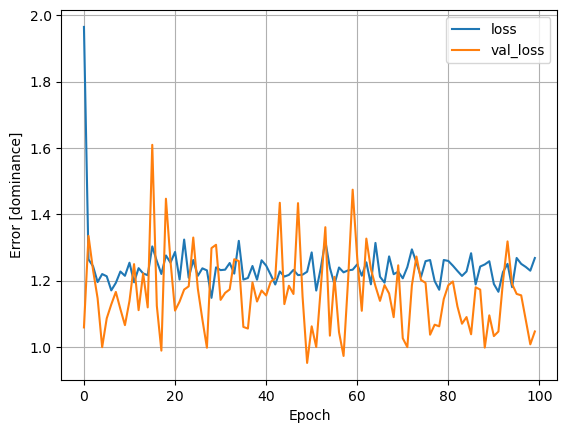

In [ ]:
# The training loss (blue) indicates how well the model is fitting the training data,
# while the validation loss indicates how well the model fits the validation data (20% subsets).
plot_loss(history)

In [ ]:
test_results = {}

test_results['linear_model'] = linear_model.evaluate(
    X_test_feature_selection, y_test, verbose=0)

In [ ]:
test_results

{'linear_model': 1.0979527235031128}

In [ ]:
# That was a single layer neural network so let's try to do better! Basically one node to learn the entire problem

# here is just a basic mod

standard_dnn_model = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

standard_dnn_model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))

standard_dnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizati  (None, 94)                189       
 on)                                                             
                                                                 
 dense_1 (Dense)             (None, 64)                6080      
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 10494 (41.00 KB)
Trainable params: 10305 (40.25 KB)
Non-trainable params: 189 (760.00 Byte)
_________________________________________________________________


In [ ]:
history = standard_dnn_model.fit(
    X_train_feature_selection,
    y_train,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2)

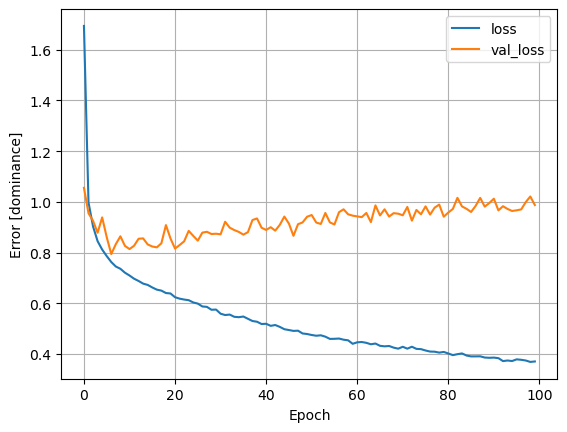

In [ ]:
plot_loss(history)

In [ ]:
test_results['standard_dnn_model'] = standard_dnn_model.evaluate(
    X_test_feature_selection, y_test, verbose=0)

test_results

{'linear_model': 1.0979527235031128, 'standard_dnn_model': 0.9784145951271057}

In [ ]:
### USE THE KERAS TUNER FOR GRID SEARCH

In [ ]:
! pip install keras_tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 943.9 kB/s eta 0:00:00a 0:00:01


In [ ]:
# let's use keras_tuner
# https://keras.io/keras_tuner/
# https://keras.io/guides/keras_tuner/getting_started/
import keras_tuner

In [ ]:
def build_model(hp):
    model = keras.Sequential()
    #model.add(normalizer)
    model.add(layers.Flatten())

    # Tune the number of layers.
    for i in range(hp.Int("num_layers", 1, 5)): # test 1-5 layers of neurons
        model.add(
            layers.Dense(
                # Tune number of units separately.
                units=hp.Int(f"units_{i}", min_value=32, max_value=512, step=32), # how many neurons in our layers?
                # NOTE that our number of neurons should be 2 to the power of (some number) = [2, 4, 16, 32, 64, ...]
                activation=hp.Choice("activation", ["relu", "tanh"]), # https://towardsdatascience.com/activation-functions-neural-networks-1cbd9f8d91d6
            )
        )
    '''
    # for single layer you can just add a layer and test different neuron amounts
    model.add(
        layers.Dense(
            # Tune number of units.
            units=hp.Int("units", min_value=32, max_value=512, step=32),
            # Tune the activation function to use.
            activation=hp.Choice("activation", ["relu", "tanh"]),
        )
    )
    '''
    # Tune whether to use dropout.
    # https://medium.com/analytics-vidhya/a-simple-introduction-to-dropout-regularization-with-code-5279489dda1e
    if hp.Boolean("dropout"):
        model.add(layers.Dropout(rate=0.25))

    # the output layer - let's just make it a layer with 1 neuron and a RELU activation
    # because we want the numbers to go above 1 and we dont want them negative - it's perfect!
    model.add(layers.Dense(1, activation="relu"))

    # Define the optimizer learning rate as a hyperparameter for the Adam optimization
    learning_rate = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")

    # Adam tends to be a generally great choice for optimization so we'll stick with that
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss="mean_absolute_error",
        metrics=["mean_absolute_error"],
    )
    return model

tuner = keras_tuner.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10
)

# Start the search and get the best model:

tuner.search(X_train_feature_selection, y_train, epochs=100, validation_data=(X_test_feature_selection, y_test))

Trial 10 Complete [00h 00m 45s]
val_loss: 0.7378532290458679

Best val_loss So Far: 0.7378532290458679
Total elapsed time: 00h 04m 23s


In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 9
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 5, 'step': 1, 'sampling': 'linear'}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
dropout (Boolean)
{'default': False, 'conditions': []}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_2 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_3 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_4 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_val

In [ ]:
tuner.results_summary()

Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 09 summary
Hyperparameters:
num_layers: 5
units_0: 128
activation: tanh
dropout: True
lr: 0.0002373832490075881
units_1: 320
units_2: 320
units_3: 288
units_4: 128
Score: 0.7378532290458679

Trial 05 summary
Hyperparameters:
num_layers: 1
units_0: 32
activation: tanh
dropout: True
lr: 0.0001383200437458141
units_1: 512
units_2: 384
units_3: 448
units_4: 288
Score: 0.755855143070221

Trial 06 summary
Hyperparameters:
num_layers: 4
units_0: 512
activation: tanh
dropout: True
lr: 0.0008170013503065374
units_1: 288
units_2: 480
units_3: 320
units_4: 192
Score: 0.7661854028701782

Trial 02 summary
Hyperparameters:
num_layers: 2
units_0: 128
activation: tanh
dropout: False
lr: 0.0018602985474974727
units_1: 480
units_2: 512
units_3: 352
units_4: 192
Score: 0.7679840922355652

Trial 08 summary
Hyperparameters:
num_layers: 3
units_0: 288
activation: tanh
dropout: False
lr: 0.

In [ ]:
'''
Trial 09 summary
Hyperparameters:
num_layers: 5
units_0: 128
activation: tanh
dropout: True
lr: 0.0002373832490075881
units_1: 320
units_2: 320
units_3: 288
units_4: 128
Score: 0.7378532290458679
'''

tuned_dnn_model = keras.Sequential([
    normalizer,
    layers.Dense(128, activation='tanh'),
    layers.Dropout(0.25),
    layers.Dense(320, activation='tanh'),
    layers.Dropout(0.25),
    layers.Dense(320, activation='tanh'),
    layers.Dropout(0.25),
    layers.Dense(288, activation='tanh'),
    layers.Dropout(0.25),
    layers.Dense(128, activation='tanh'),
    layers.Dropout(0.25),
    layers.Dense(1, activation='relu')
  ])

tuned_dnn_model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.0002373832490075881))

tuned_dnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizati  (None, 94)                189       
 on)                                                             
                                                                 
 dense_6 (Dense)             (None, 128)               12160     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 320)               41280     
                                                                 
 dropout_2 (Dropout)         (None, 320)               0         
                                                                 
 dense_8 (Dense)             (None, 320)               102720    
                                                      

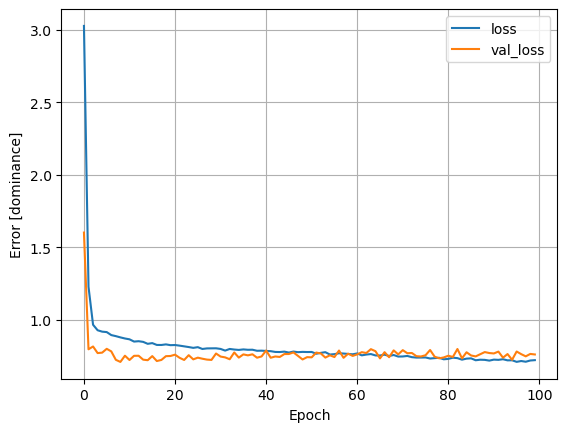

In [ ]:
history = tuned_dnn_model.fit(
    X_train_feature_selection,
    y_train,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2)

plot_loss(history)

In [ ]:
test_results['tuned_dnn_model'] = tuned_dnn_model.evaluate(
    X_test_feature_selection, y_test, verbose=0)

test_results

{'linear_model': 1.0979527235031128,
 'standard_dnn_model': 0.9784145951271057,
 'tuned_dnn_model': 0.7605056762695312}

In [ ]:
# let's save this best model
save_best_model = tf.keras.callbacks.ModelCheckpoint('keras language tmp/', monitor='val_loss',
                                  save_best_only=True, save_weights_only=True)

# fit model and save the best (of the 100 epochs) to "keras language tmp" folder
tuned_dnn_model.fit(X_train_feature_selection, y_train,
              batch_size=64,
              epochs=100,
              validation_data=(X_test_feature_selection, y_test),
              callbacks=[save_best_model])

Epoch 1/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7293 - val_loss: 0.7474
Epoch 2/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7227 - val_loss: 0.7565
Epoch 3/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7264 - val_loss: 0.7578
Epoch 4/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7264 - val_loss: 0.7536
Epoch 5/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7287 - val_loss: 0.7579
Epoch 6/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7206 - val_loss: 0.7618
Epoch 7/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7237 - val_loss: 0.7559
Epoch 8/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7208 - val_loss: 0.7559
Epoch 9/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7173 - val_loss: 0.7544
Epoch 10/100
113/113 [==============================] - 0s 3ms/step - loss: 0.7215 - val_lo

In [ ]:
# reload the best model with:
# tuned_dnn_model.load_weights('keras language tmp/')

# evaluate with
# tuned_dnn_model.evaluate(X_test, y_test, verbose=0)

### now we know which model and hyperparameters maximizes our train and validate data so we can load in our test data and test that best model on it for a final score!

In [ ]:
test = pd.read_excel('TEST language data.xlsx')

In [ ]:
X_test = test[all_float_or_int_features].replace((np.inf, -np.inf, np.nan), 0)
X_test_feature_selection = X_test.iloc[:,cols]
y_test = test['dominance_tags']

In [ ]:
final_model = GradientBoostingRegressor(criterion='squared_error',learning_rate=0.1,loss='absolute_error',min_samples_leaf=8,n_estimators=100)

final_model.fit(X_train_validate_feature_selection, ytrain_validate_dominance)

# evaluate the model
y_pred = final_model.predict(X_test_feature_selection)

# evaluate predictions
mae = mean_absolute_error(y_test, y_pred)

print('mean absolute error on test set (gradient boosting): ', mae)

mean absolute error on test set:  0.7766903312299782


In [ ]:
# reload the best model with:
tuned_dnn_model.load_weights('keras language tmp/')

# evaluate with:
mae_nn = tuned_dnn_model.evaluate(X_test_feature_selection, y_test, verbose=0)

print('mean absolute error on test set (neural network): ', mae_nn)

mean absolute error on test set (neural network):  0.7956883311271667
